In [4]:
# SETUP --------------------------
from analysis.toolbox import *
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim

from transformers import AutoTokenizer, GPT2LMHeadModel, PhrasalConstraint, QuantoConfig
from undecorated import undecorated
from types import MethodType

import time
import pickle
import io
import os
from tqdm import tqdm

import mlflow

device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)

torch.set_default_device(device)
print(f"Using {device} device")
print(torch.tensor([1, 2, 3]).device)

# MAGICKS --------------------------
s_model = "gpt2"
iSeed = 4523522
sPadding = "left"
sNameAEModel = "Hair20eos"

lTargetStrings = [
    "Experience 50% more visible shine after just one use.", #0
    "Formulated with light-reflecting technology for a glossy finish.", #1
    "Transform dull strands into radiant, luminous locks.", #2
    "Infused with nourishing oils that enhance natural shine.", #3
    "See instant brilliance with our advanced shine-boosting formula.", #4
    "Locks in moisture to amplify hair's natural luster.", #5
    "Achieve salon-quality shine without leaving home.", #6
    "Visible reduction in dullness, replaced with stunning shine.", #7
    "Say goodbye to lackluster hair, hello to mirror-like shine.", #8
    "Clinically proven to enhance shine by up to 70%.", # ^tangible #9
    "Elevate your confidence with hair that gleams under any light.", #10
    "Embrace the allure of luminous hair that turns heads.", #11
    "Unleash the power of radiant hair that speaks volumes.", #12
    "Transform your look with hair that exudes brilliance.", #13
    "Feel the difference of hair that shines with vitality and health.", #14
    "Rediscover the joy of hair that beams with inner vibrancy.", #15
    "Indulge in the luxury of hair that shimmers with elegance.", #16
    "Step into the spotlight with hair that radiates beauty.", #17
    "Experience the magic of hair that dazzles with every movement.", #18
    "Unlock the secret to hair that shines from within, reflecting your inner glow." #19,
]

lTargetStrings = [
    # Health Benefits
    "Boost Your Immunity with Every Spoonful.",
    "Packed with Probiotics for a Healthier You.",
    "Nourish Your Body with Natural Goodness.",
    "Strengthen Your Gut with Live Cultures.",
    "Low in Sugar, High in Vital Nutrients.",
    "Daily Dose of Calcium for Strong Bones.",
    "Feel Energized with Protein-Rich Yoghurt.",
    "Healthy Digestion Starts Here.",
    "Antioxidant-Rich for a Balanced Diet.",
    "Supports Heart Health with Omega-3s.",
    
    # Taste
    "Indulge in Creamy Delight.",
    "Rich, Velvety Texture in Every Bite.",
    "Taste the Burst of Real Fruit Flavor.",
    "Pure Decadence Without the Guilt.",
    "Experience the Silky Smooth Perfection.",
    "Savor the Freshness of Farm-Fresh Ingredients.",
    "Gourmet Flavors to Satisfy Your Cravings.",
    "Deliciously Tangy, Perfectly Sweet.",
    "Treat Your Taste Buds to Luxurious Bliss.",
    "Heavenly Taste in Every Spoonful."
]

# lTargetStrings = [
#     "Experience 50% more visible shine after just one use.", #0
#     "Formulated with light-reflecting technology for a glossy finish.", #1
#     "Transform dull strands into radiant, luminous locks.", #2
#     "Infused with nourishing oils that enhance natural shine.", #3
#     "See instant brilliance with our advanced shine-boosting formula.", #4
#     "Locks in moisture to amplify hair's natural luster.", #5
#     "Achieve salon-quality shine without leaving home.", #6
#     "Visible reduction in dullness, replaced with stunning shine.", #7
#     "Say goodbye to lackluster hair, hello to mirror-like shine.", #8
#     "Clinically proven to enhance shine by up to 70%.", # ^tangible #9
#     "Elevate your confidence with hair that gleams under any light.", #10
#     "Embrace the allure of luminous hair that turns heads.", #11
#     "Unleash the power of radiant hair that speaks volumes.", #12
#     "Transform your look with hair that exudes brilliance.", #13
#     "Feel the difference of hair that shines with vitality and health.", #14
#     "Rediscover the joy of hair that beams with inner vibrancy.", #15
#     "Indulge in the luxury of hair that shimmers with elegance.", #16
#     "Step into the spotlight with hair that radiates beauty.", #17
#     "Experience the magic of hair that dazzles with every movement.", #18
#     "Unlock the secret to hair that shines from within, reflecting your inner glow." #19,
#     "Our surface cleaner delivers a mirror-like shine every time.", # cleaner
#     "Say goodbye to streaks and smudges with our powerful formula.",
#     "Achieve a noticeable sparkle on all surfaces with just one application.",
#     "Experience surfaces so clean, you can see your reflection in them.",
#     "Our cleaner leaves behind a gleaming, polished finish that lasts.",
#     "Restore surfaces to their original luster with ease.",
#     "Enjoy visibly brighter and shinier countertops, tables, and more.",
#     "Transform dull surfaces into glossy showcases in seconds.",
#     "Witness the difference with surfaces that look and feel brand new.",
#     "Get a professional-level shine without the hassle or expense.", # ^tangible
#     "Elevate your surroundings with a touch of brilliance.",
#     "Unleash the hidden beauty of your home with our surface cleaner.",
#     "Experience the joy of pristine surfaces that brighten your space.",
#     "Bring a sense of clarity and freshness to your environment.",
#     "Enhance the ambiance of any room with surfaces that radiate.",
#     "Feel the satisfaction of a space that sparkles with cleanliness.",
#     "Transform your living space into a haven of luminosity.",
#     "Revel in the beauty of surfaces that reflect your attention to detail.",
#     "Discover the magic of surfaces that shimmer with cleanliness.",
#     "Immerse yourself in the brilliance of a home that truly shines."
# ]
# lTargetStrings = [
#     "Experience 50% more visible shine after just one use."
# ]


iClaims = len(lTargetStrings)
iEncodingDim = 2
iOutputSize = 768

torch.manual_seed(iSeed)
model = GPT2LMHeadModel.from_pretrained(s_model, device_map=device, resume_download=True)
tokenizer = AutoTokenizer.from_pretrained(s_model, resume_download=True)

if tokenizer.pad_token is None:
            tokenizer.pad_token = tokenizer.eos_token

tOHETarget = create_input_data(iClaims)
tTargetStrings, lLengths = TokenizeClaims(lTargetStrings, tokenizer)
iMaxTokens = max(lLengths)

tInputEmbeddings = model.get_input_embeddings()(tTargetStrings)
# TODO: Put mask at the beginning or the end? Beginning seems more plausible, and yields to higher loss
# TODO: Look into `past_key_values`, can speed things up by caching the hidden states
tTarget = torch.cat([torch.tensor([-100] * iClaims).unsqueeze(-1), tTargetStrings], dim = 1)

Using mps device
mps:0


In [5]:
tInputEmbeddings.shape
tInputData = tInputEmbeddings.mean(dim=1)
tInputData.shape

torch.Size([20, 768])

In [6]:
class Autoencoder(nn.Module):
   def __init__(self, input_size, encoding_dim, output_size):
       super(Autoencoder, self).__init__()
       self.encoder = nn.Sequential(
           nn.Linear(input_size, 192, bias=True),
           nn.LeakyReLU(negative_slope=0.01, inplace=False),
           nn.Linear(192, 48, bias=True),
           nn.LeakyReLU(negative_slope=0.01, inplace=False),
           nn.Linear(48, encoding_dim, bias=True)
       )
       self.decoder = nn.Sequential(
           nn.Linear(encoding_dim, output_size, bias=True)
       )

   def forward(self, x):
       x = self.encoder(x)
       x = self.decoder(x)
       return x

In [7]:
# activation, hidden units, bias, other
sAENameArchitecture = "linear_2h_both_none_ae"
ae = Autoencoder(iOutputSize, iEncodingDim, iOutputSize)
#ae.load_state_dict(torch.load(f"../models/{sNameAEModel}.pt"))

In [8]:
try:
    mlflow.end_run()
except:
    pass
# localhost:5050
mlflow.set_tracking_uri(uri="http://127.0.0.1:5000")
mlflow.set_experiment(sAENameArchitecture)

<Experiment: artifact_location='mlflow-artifacts:/959224011598528658', creation_time=1716961347761, experiment_id='959224011598528658', last_update_time=1716961347761, lifecycle_stage='active', name='linear_2h_both_none_ae', tags={}>

In [9]:
lGradWeightsDecoder = []
lGradBiasDecoder = []
lGradWeightsEncoder = []
lGradBiasEncoder = []
lStepsWeightsDecoder = []
lStepsBiasDecoder = []
lStepsWeightsEncoder = []
lStepsBiasEncoder = []
lStepsWeightsDecoder = []
lStepsBiasDecoder = []
lStepsWeightsEncoder = []
lStepsBiasEncoder = []

In [10]:
from graphviz import Digraph
import torch
from torch.autograd import Variable, Function

def iter_graph(root, callback):
    queue = [root]
    seen = set()
    while queue:
        fn = queue.pop()
        if fn in seen:
            continue
        seen.add(fn)
        for next_fn, _ in fn.next_functions:
            if next_fn is not None:
                queue.append(next_fn)
        callback(fn)

def register_hooks(var):
    fn_dict = {}
    def hook_cb(fn):
        def register_grad(grad_input, grad_output):
            fn_dict[fn] = grad_input
        fn.register_hook(register_grad)
    iter_graph(var.grad_fn, hook_cb)

    def is_bad_grad(grad_output):
            if grad_output is None:
                    return True
            grad_output = grad_output.data
            return grad_output.ne(grad_output).any() or grad_output.gt(1e6).any()

    def make_dot():
        node_attr = dict(style='filled',
                        shape='box',
                        align='left',
                        fontsize='12',
                        ranksep='0.1',
                        height='0.2')
        dot = Digraph(node_attr=node_attr, graph_attr=dict(size="12,12"))

        def size_to_str(size):
            return '('+(', ').join(map(str, size))+')'

        def build_graph(fn):
            if hasattr(fn, 'variable'):  # if GradAccumulator
                u = fn.variable
                node_name = 'Variable\n ' + size_to_str(u.size())
                dot.node(str(id(u)), node_name, fillcolor='lightblue')
            else:
                assert fn in fn_dict, fn
                fillcolor = 'white'
                if any(is_bad_grad(gi) for gi in fn_dict[fn]):
                    fillcolor = 'red'
                dot.node(str(id(fn)), str(type(fn).__name__), fillcolor=fillcolor)
            for next_fn, _ in fn.next_functions:
                if next_fn is not None:
                    next_id = id(getattr(next_fn, 'variable', next_fn))
                    dot.edge(str(next_id), str(id(fn)))
        iter_graph(var.grad_fn, build_graph)

        return dot

    return make_dot

In [11]:
import torch
from torch.optim.optimizer import Optimizer, required

# Implement a constant step optimizer; Newton Raphson, lr is \delta x
class ConstantStepOptimizer(Optimizer):
    def __init__(self, params, lr=required):
        if lr is not required and lr <= 0.0:
            raise ValueError("Invalid learning rate: {}".format(lr))
        defaults = dict(lr=lr)
        super(ConstantStepOptimizer, self).__init__(params, defaults)

    def step(self, closure=None):
        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            for p in group['params']:
                if p.grad is not None:
                    d_p = p.grad.data
                    p.data.add_(-lr * d_p)

        return loss

In [12]:
mlflow.pytorch.autolog()
sRunName = "dairy_util_hedonic_2layer_encoder"
dLearningRate = 1e-1
dEps = 1e-3 # NOTE: It seems that the -LL is computed wrt to e, not base 10! Hence e^(-dEps) = L
dEps = 5e-2 # NOTE: It seems that the -LL is computed wrt to e, not base 10! Hence e^(-dEps) = L
dWeightDecay = 0
dMaxGrad = None
iBreakAtEpochs = 1e4
iBatchSize = min(32, iClaims)
bSaveModels = False
dLambda = None # Set to None to turn of
optimizer = optim.Adam(
    [{'params': ae.encoder.parameters(), 'lr': 1e1},
     {'params': ae.decoder.parameters(), 'lr': 1e-2}]
)
optimizer = ConstantStepOptimizer(ae.parameters(), lr=dLearningRate)
optimizer = optim.Adam(ae.parameters(), lr=dLearningRate, weight_decay=dWeightDecay)

# Start an MLflow experiment
with mlflow.start_run(run_name=sRunName):
    
    mlflow.log_param("Optimizer", optimizer)
    mlflow.log_param("iClaims", iClaims)
    mlflow.log_param("iBatchSize", iBatchSize)
    mlflow.log_param("iBreakAtEpochs", iBreakAtEpochs)
    mlflow.log_param("dEps", dEps)
    mlflow.log_param("dLearningRate", dLearningRate)
    mlflow.log_param("dWeightDecay", dWeightDecay)
    mlflow.log_param("dMaxGrad", dMaxGrad)
    mlflow.log_param("bSaveModels", bSaveModels)
    mlflow.log_param("dLambda", dLambda)
    
    iEpoch = 0
    lLoss = []
    lTime = []
    while True:

        iEpoch += 1
        tic = time.time()

        tSummaryEmbedding = ae(tInputData).unsqueeze(1)
        tInputs = torch.cat([tSummaryEmbedding, tInputEmbeddings], dim=1)
        
        optimizer.zero_grad()
        
        # NOTE: Necessary to keep making use of batching of the LLM, otherwise runs sequential ...
        loss = torch.tensor([0], dtype=torch.float32, requires_grad=True)
        for i, b in enumerate(range(0, iClaims, iBatchSize)):
            # NOTE: What if we exceed dim?, unit test
            out = model(inputs_embeds = tInputs[b:((i + 1)*iBatchSize), :, :], labels=tTarget[b:((i + 1)*iBatchSize), :])
            loss = loss + out[0]
        
        if dLambda is not None and iEpoch > 1:
            dL2 = torch.tensor([0], dtype=torch.float32, requires_grad=True)
            # See Goodfellow et al. (2016) Ch 13 & 14; Sparse Autoencoder, comes down to L1-reg on encoder for us
            for param in ae.encoder.parameters():
                dL2 = dL2 + torch.linalg.vector_norm(param, ord=1)
            loss = loss + dLambda * dL2
                
        
        #get_dot = register_hooks(loss)
        loss.backward(retain_graph=True)
        lLoss.append(loss.item())

        #dot = get_dot()
        #dot.save('tmp.dot')
        
        # NOTE: Clip the gradients to avoid exploding gradients
        if dMaxGrad is not None:
            assert dMaxGrad > 0, "Max grad should be positive"
            torch.nn.utils.clip_grad_norm_(ae.parameters(), max_norm=dMaxGrad) # adjust for level
        
        tDecoderWOld = ae.decoder[0].weight.cpu().detach().numpy()
        tDecoderBOld = ae.decoder[0].bias.cpu().detach().numpy()
        tEncoderWOld = ae.encoder[0].weight.cpu().detach().numpy()
        tEncoderBOld = ae.encoder[0].bias.cpu().detach().numpy()
        
        lGradWeightsDecoder.append(torch.norm(ae.decoder[0].weight.grad).cpu().detach().numpy())
        lGradBiasDecoder.append(torch.norm(ae.decoder[0].bias.grad).cpu().detach().numpy())
        lGradWeightsEncoder.append(torch.norm(ae.encoder[0].weight.grad).cpu().detach().numpy())
        lGradBiasEncoder.append(torch.norm(ae.encoder[0].bias.grad).cpu().detach().numpy())
        
        optimizer.step()
        
        lStepsWeightsDecoder.append(np.abs(ae.decoder[0].weight.cpu().detach().numpy() - tDecoderWOld))
        lStepsBiasDecoder.append(np.abs(ae.decoder[0].bias.cpu().detach().numpy() - tDecoderBOld))
        lStepsWeightsEncoder.append(np.abs(ae.encoder[0].weight.cpu().detach().numpy() - tEncoderWOld))
        lStepsBiasEncoder.append(np.abs(ae.encoder[0].bias.cpu().detach().numpy() - tEncoderBOld))

        # Log the loss to MLflow
        mlflow.log_metric("nLL", loss.item())
        mlflow.log_metric("iNEpochs", iEpoch)

        toc = time.time()
        dTime = toc - tic
        lTime.append(dTime)
        mlflow.log_metric("TimePerEpoch", toc - tic)
        
        if bSaveModels:
            mlflow.pytorch.save_model(ae, f"log_models/models_{iEpoch}")
        
        if iEpoch % 10 == 0:
            plot_results(dTime, sAENameArchitecture, iEncodingDim, ae, lLoss, None, lStepsWeightsEncoder, lStepsBiasEncoder, lStepsWeightsDecoder, lStepsBiasDecoder, lGradWeightsEncoder, lGradBiasEncoder, lGradWeightsDecoder, lGradBiasDecoder, iEpoch, dEps, tOHETarget, lambda x: model.generate(inputs_embeds = x, max_new_tokens = iMaxTokens + 1, pad_token_id = tokenizer.pad_token_id), tokenizer)
            plot_results_last10(dTime, sAENameArchitecture, iEncodingDim, ae, lLoss, None, lStepsWeightsEncoder, lStepsBiasEncoder, lStepsWeightsDecoder, lStepsBiasDecoder, lGradWeightsEncoder, lGradBiasEncoder, lGradWeightsDecoder, lGradBiasDecoder, iEpoch, dEps, tOHETarget, lambda x: model.generate(inputs_embeds = x, max_new_tokens = iMaxTokens + 1, pad_token_id = tokenizer.pad_token_id), tokenizer)
            fig, axs = plt.subplots(1)
            axs.plot(lLoss)
            mlflow.log_figure(fig, './plots/my_plot.png')
            mlflow.pytorch.log_model(ae, "models")
            plt.close()
        
        if (iEpoch % 100 == 0) or (iEpoch == 1):
            print(f"Epoch {iEpoch}, Loss: {loss.item()}, Avg. time per Epoch {np.mean(lTime):.2f} sec")
        
        if iEpoch >= iBreakAtEpochs:
            break
        
        if loss.item() < dEps:
            break

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Epoch 1, Loss: 7.122378349304199, Avg. time per Epoch 4.47 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
/Users/hoener/miniforge3/envs/mphil/lib/python3.9/site-packages/_distutils_hack/__init__.py:11: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setu

Epoch 100, Loss: 1.3286820650100708, Avg. time per Epoch 1.50 sec


/Users/hoener/Documents/bds_lectures/mphil/src/analysis/toolbox.py:105: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(2, 4, figsize=(14, 7))
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible

Epoch 200, Loss: 0.2849879264831543, Avg. time per Epoch 1.56 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 300, Loss: 0.1901591420173645, Avg. time per Epoch 1.52 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 400, Loss: 2.030784845352173, Avg. time per Epoch 1.51 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 500, Loss: 0.8819116353988647, Avg. time per Epoch 1.52 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 600, Loss: 0.3369850814342499, Avg. time per Epoch 1.51 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 700, Loss: 0.24010340869426727, Avg. time per Epoch 1.52 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 800, Loss: 0.20162968337535858, Avg. time per Epoch 1.58 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 900, Loss: 0.1781356781721115, Avg. time per Epoch 1.60 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 1000, Loss: 0.1630418598651886, Avg. time per Epoch 1.61 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 1100, Loss: 0.15569399297237396, Avg. time per Epoch 1.62 sec


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Epoch 1200, Loss: 1.1645504236221313, Avg. time per Epoch 1.66 sec


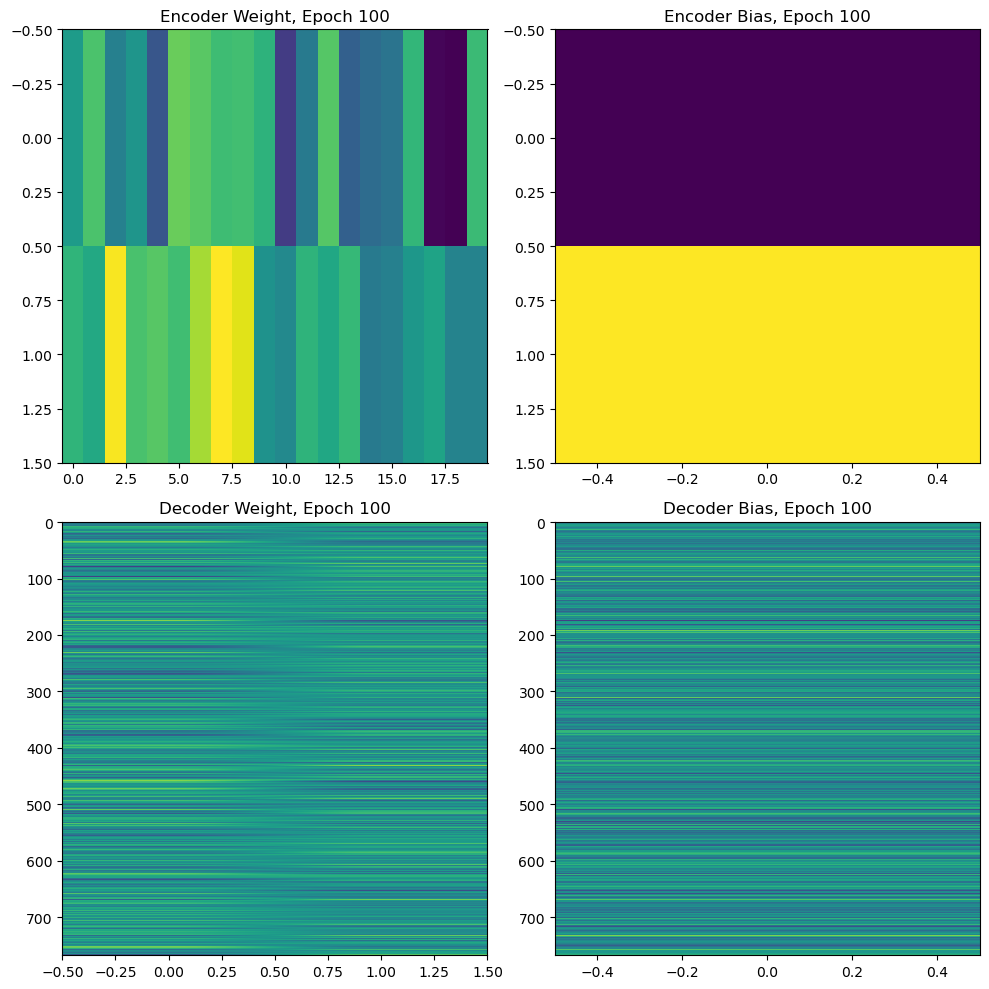

In [19]:
import torch
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def update(iE):
    model = torch.load(f"log_models/models_{iE}/data/model.pth")

    matrices = [
        model.encoder[0].weight.detach().cpu().numpy(),
        model.encoder[0].bias.unsqueeze(1).detach().cpu().numpy(),
        model.decoder[0].weight.detach().cpu().numpy(),
        model.decoder[0].bias.unsqueeze(1).detach().cpu().numpy()
    ]

    for ax, matrix, name in zip(axs.flat, matrices, matrix_names):
        ax.clear()
        im = ax.imshow(matrix, aspect='auto')
        ax.set_title(f"{name}, Epoch {iE}")
    plt.tight_layout()

matrix_names = ['Encoder Weight', 'Encoder Bias', 'Decoder Weight', 'Decoder Bias']
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

ani = FuncAnimation(fig, update, frames=range(100, 200, 1), repeat=False)
from IPython.display import HTML
HTML(ani.to_jshtml())


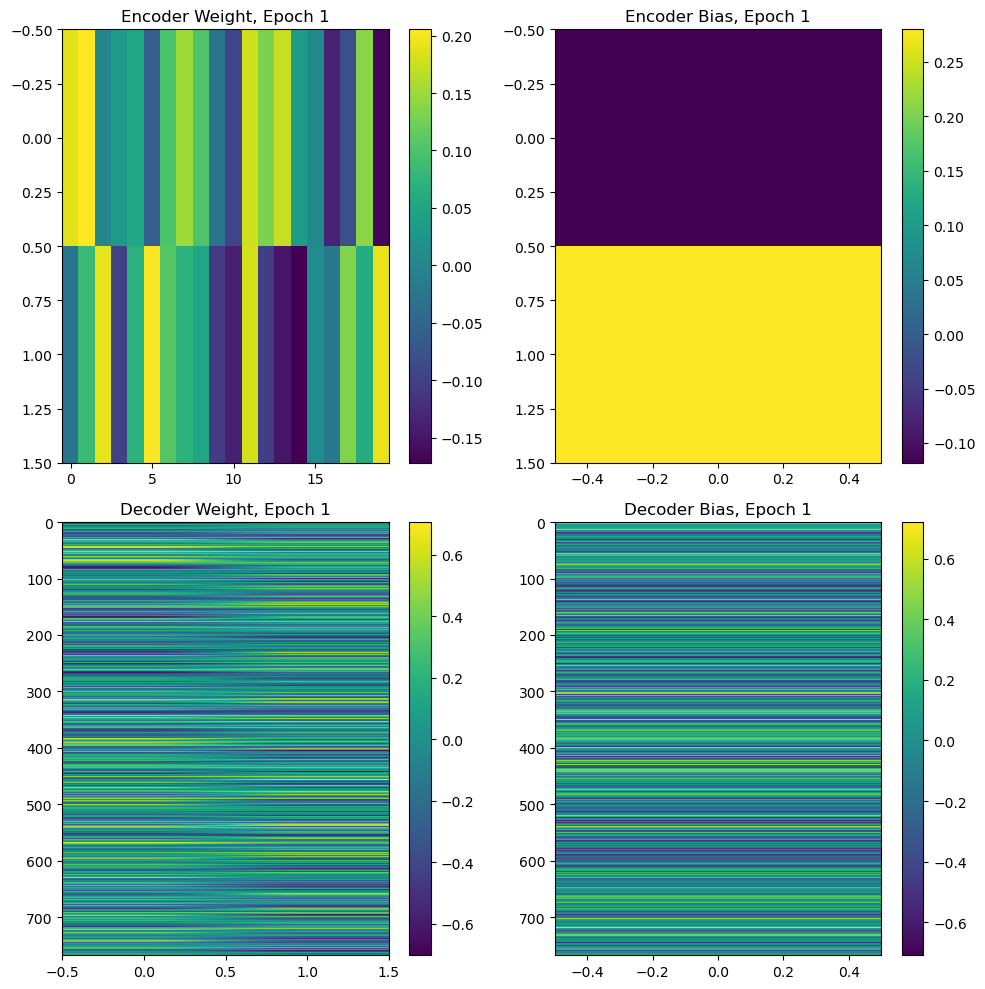

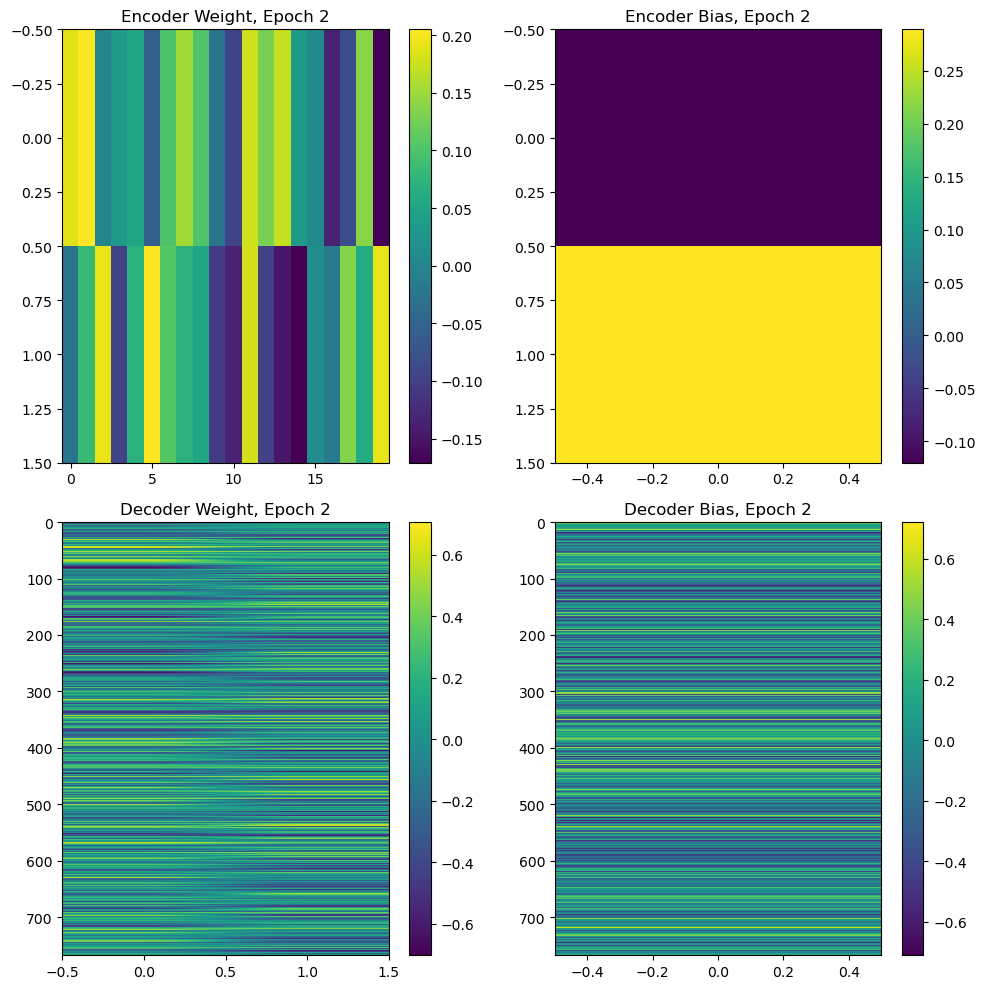

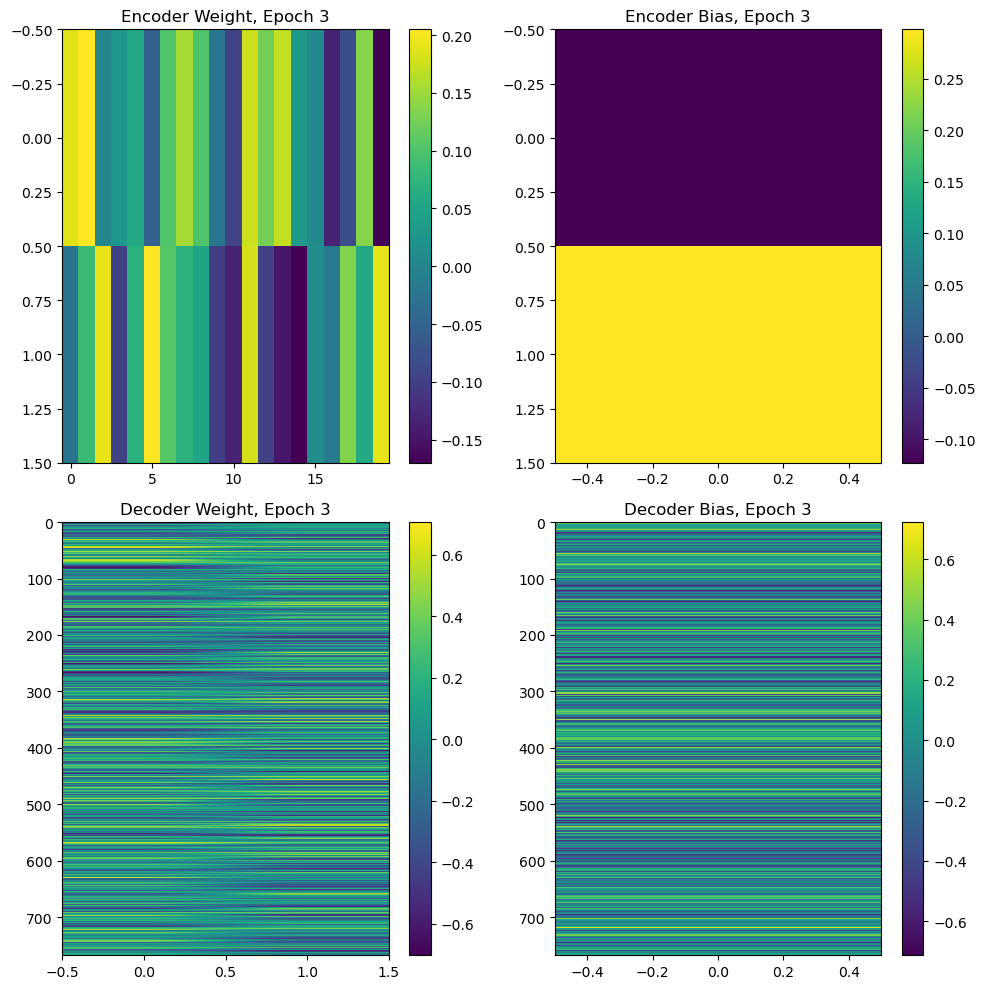

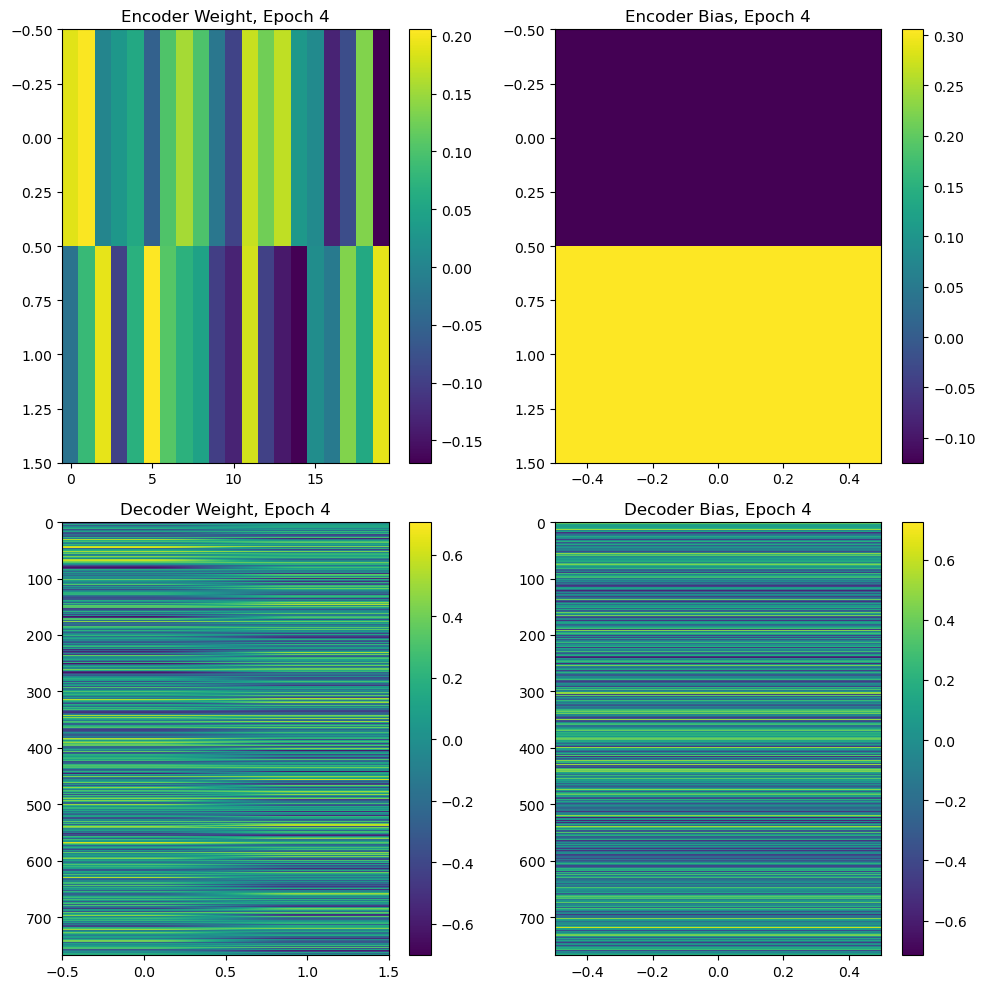

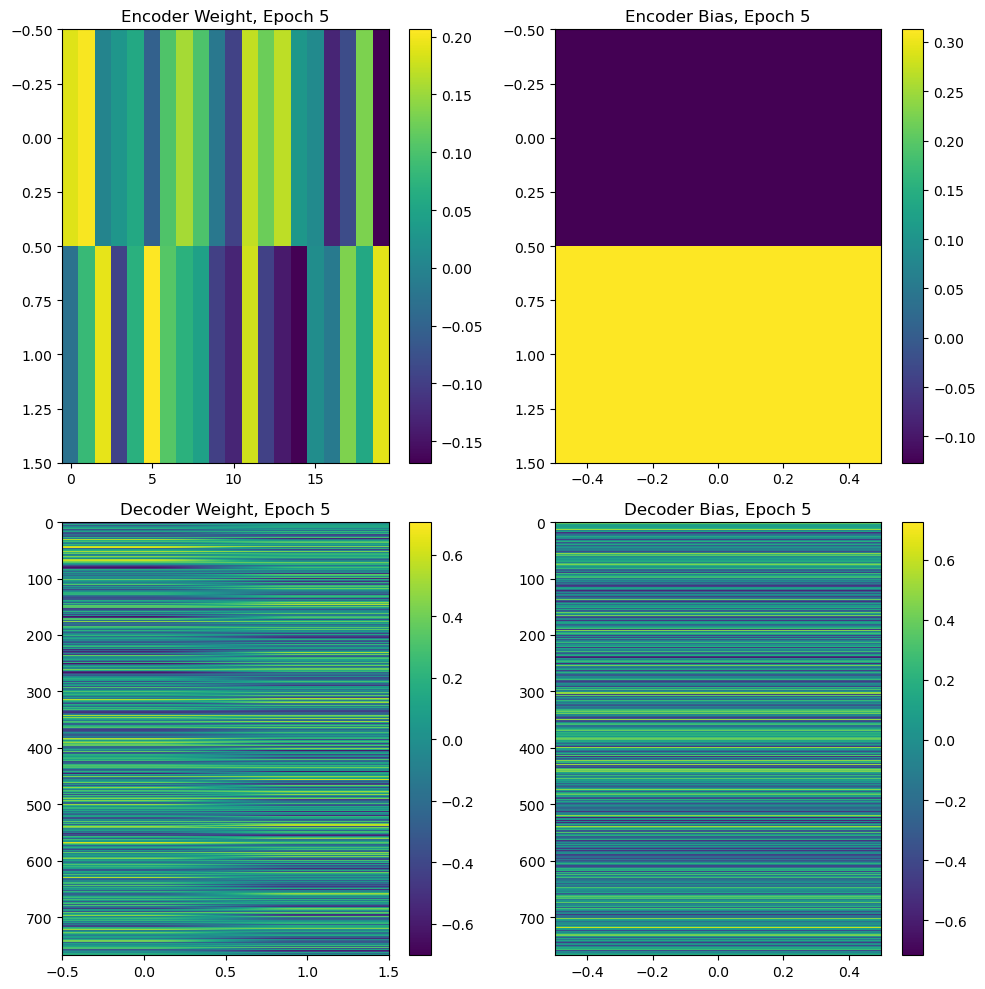

...

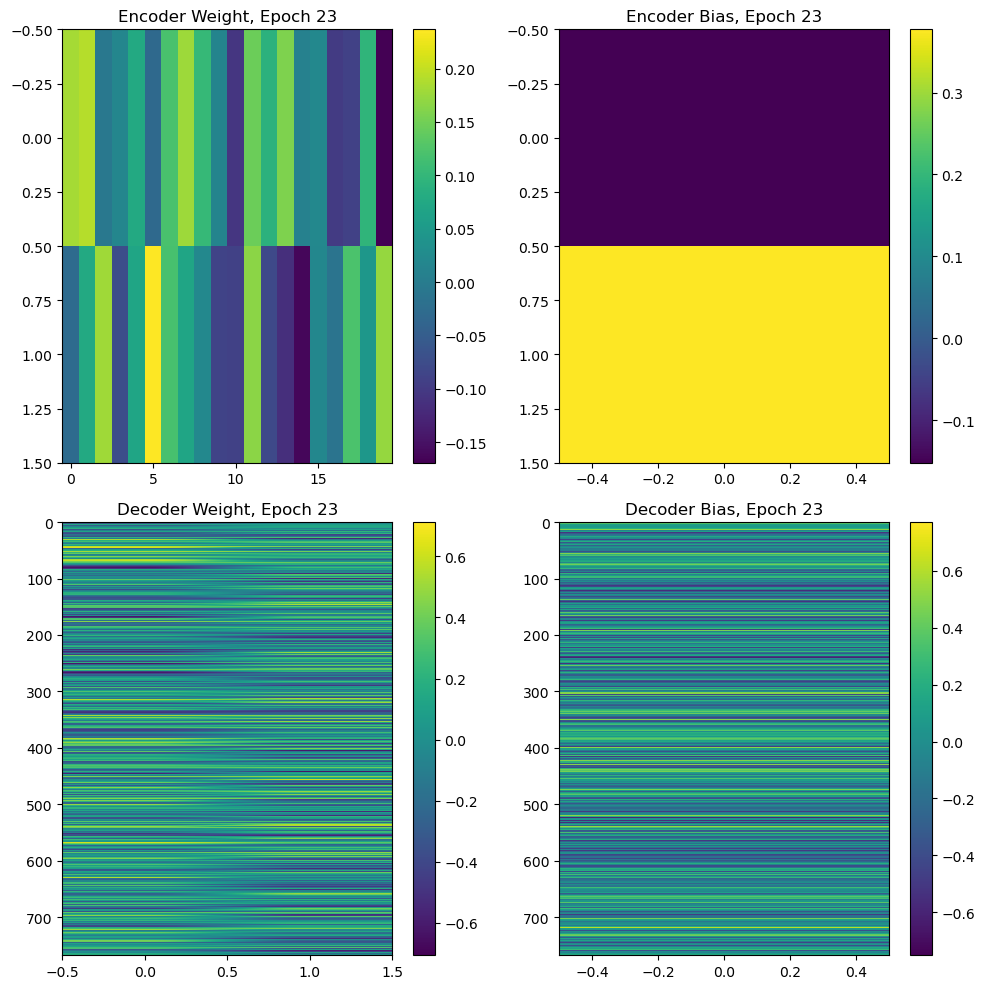

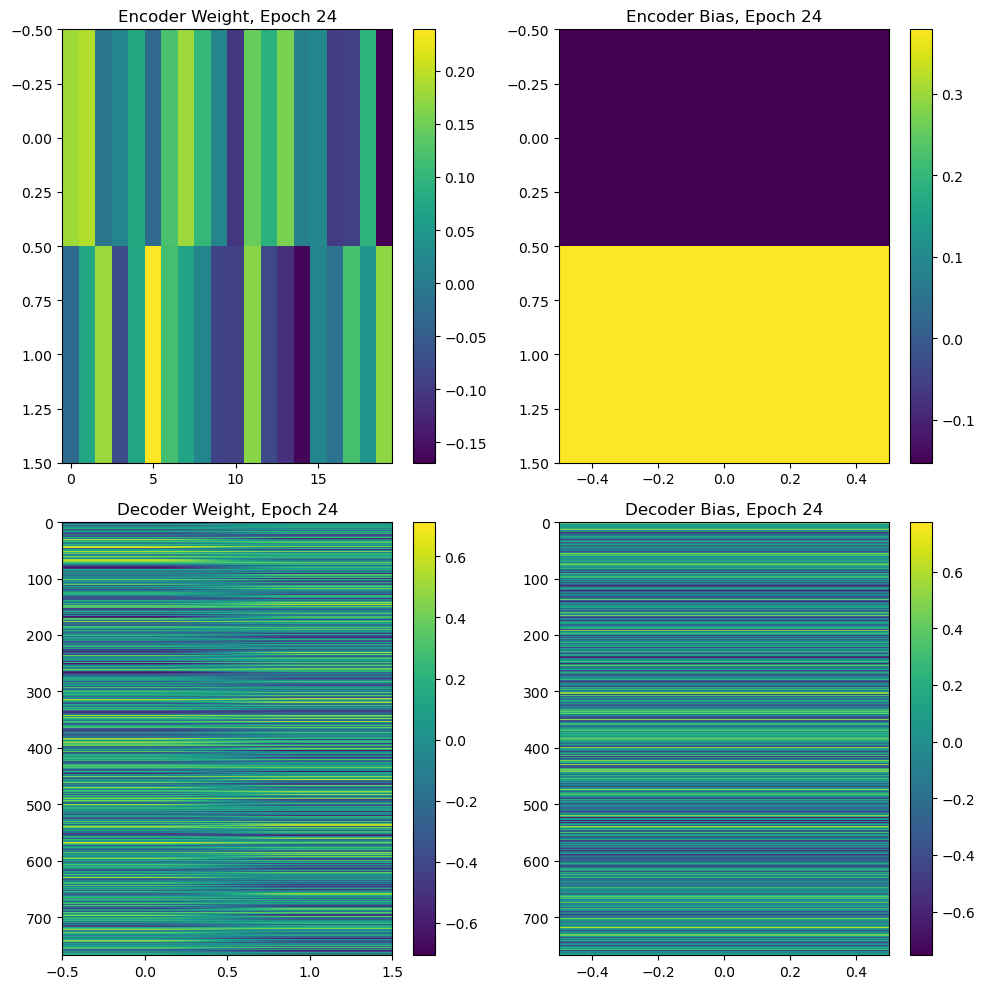

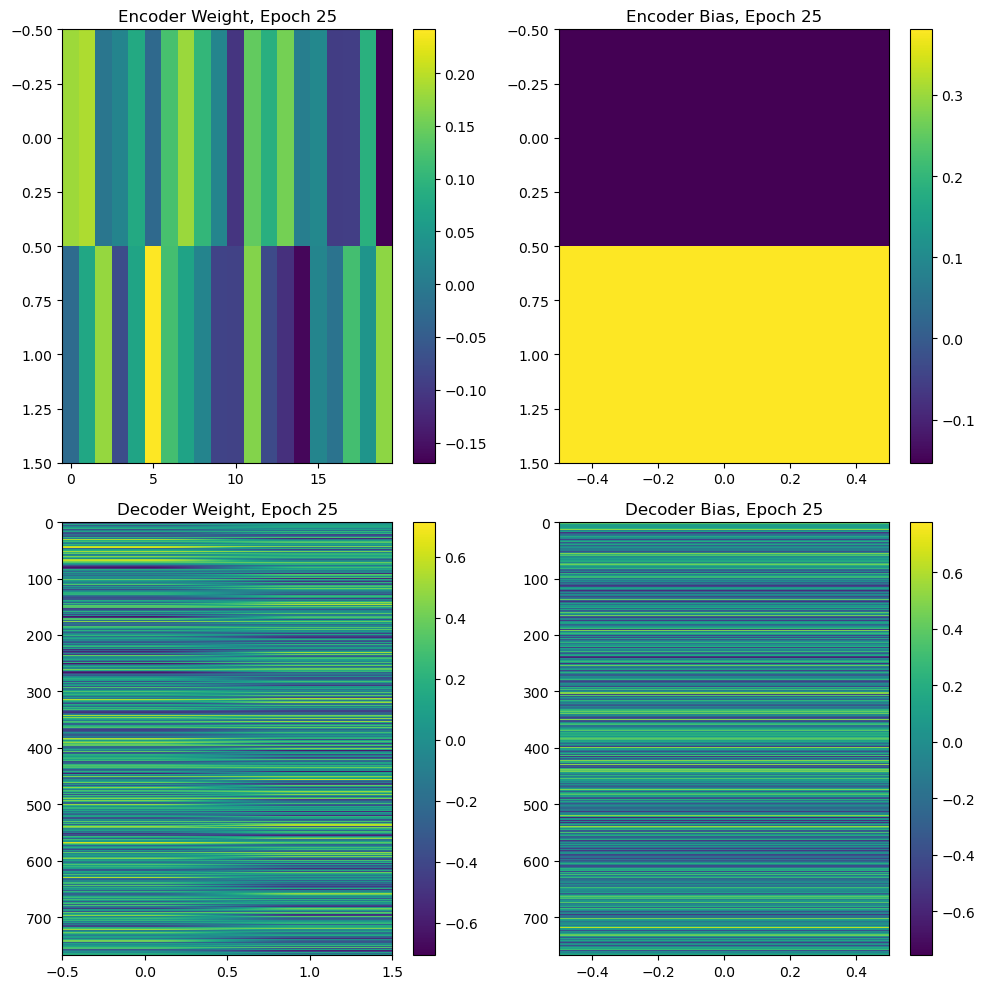

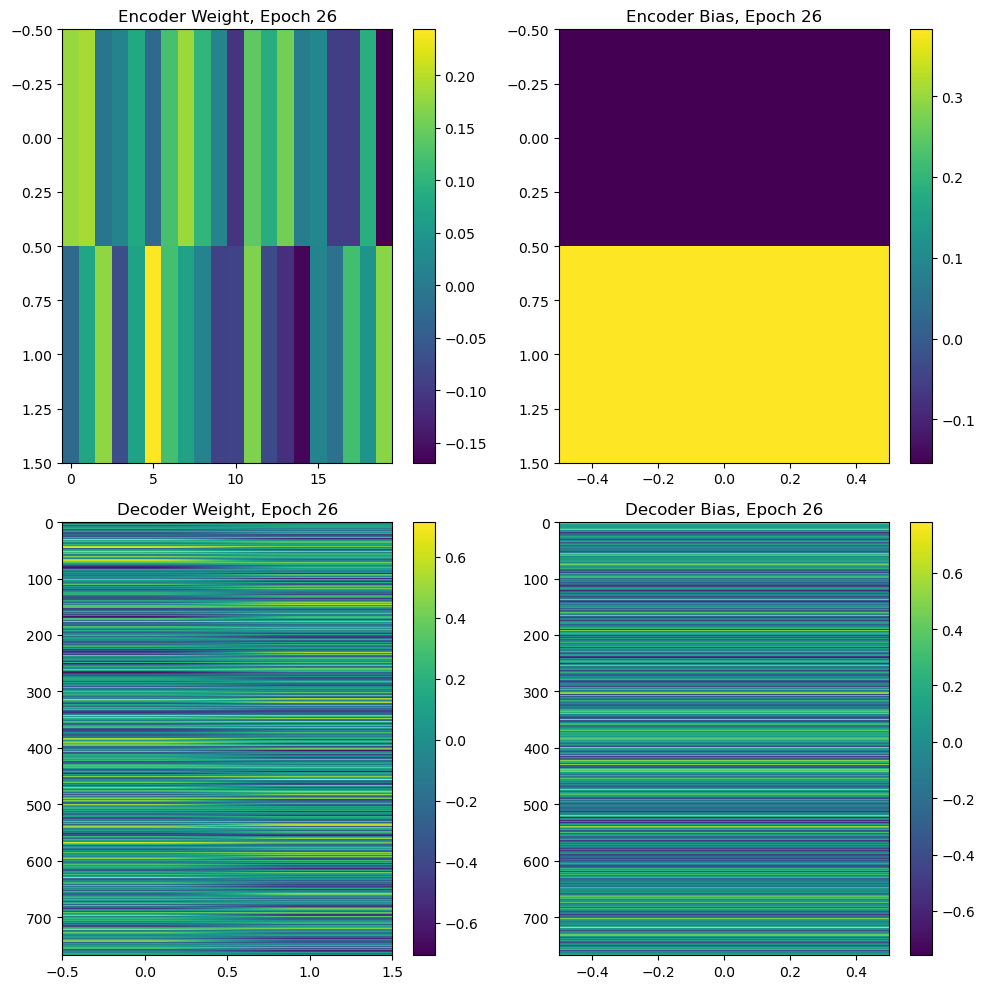

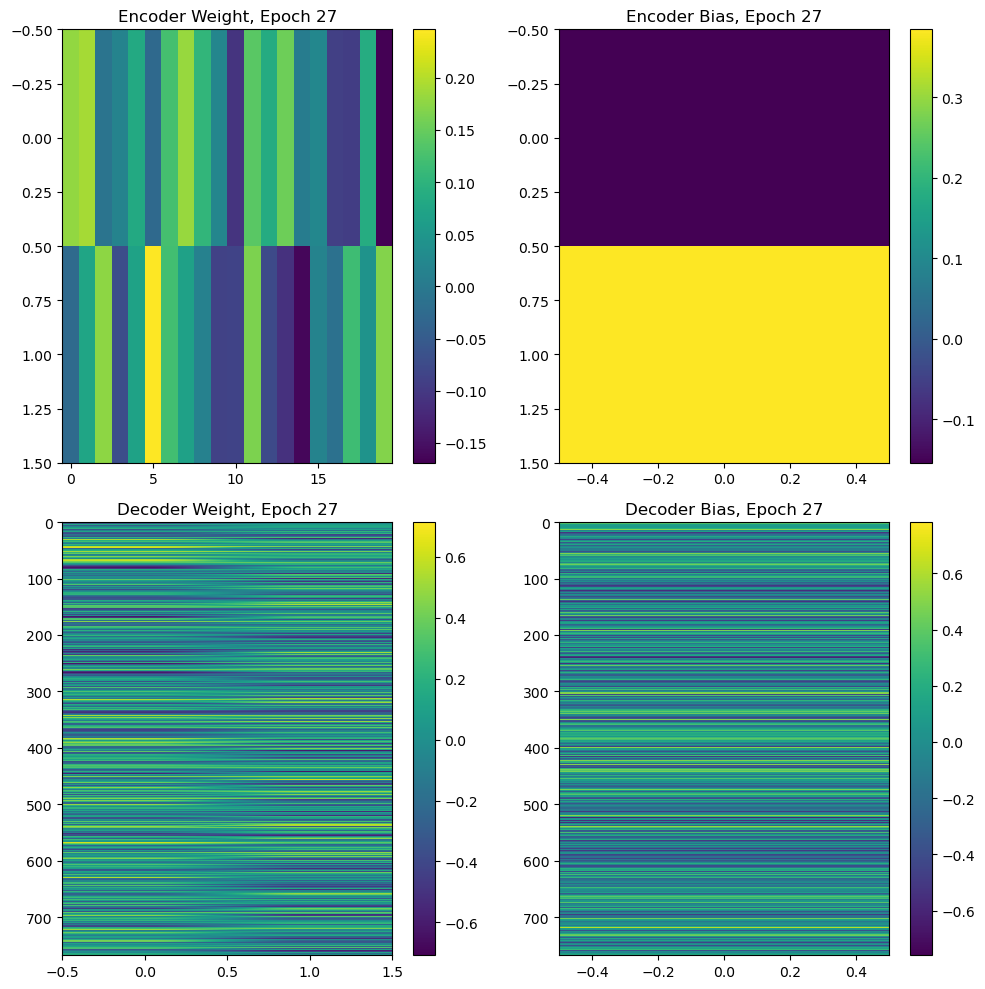

KeyboardInterrupt: 

In [67]:
import matplotlib.pyplot as plt

for iE in range(1, 121, 1):

    model = torch.load(f"log_models/models_{iE}/data/model.pth")

    # Define the four matrices
    matrix_names = ['Encoder Weight', 'Encoder Bias', 'Decoder Weight', 'Decoder Bias']
    matrices = [model.encoder[0].weight, model.encoder[0].bias.unsqueeze(1), model.decoder[0].weight, model.decoder[0].bias.unsqueeze(1)]

    # Plot the matrices
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    for i, ax in enumerate(axs.flat):
        im = ax.imshow(matrices[i].detach().cpu().numpy(), aspect='auto')
        ax.set_title(f"{matrix_names[i]}, Epoch {iE}")
        cbar = fig.colorbar(im)

    plt.tight_layout()
    plt.show()

In [17]:
tSummaryEmbeddingPred = ae(tOHETarget).unsqueeze(1)

In [18]:
# generate iMaxTokens + 1 to account for EOS of longest claim
lGenNew = model.generate(inputs_embeds = tSummaryEmbeddingPred, max_new_tokens = iMaxTokens + 1, pad_token_id = tokenizer.pad_token_id)
for i in range(iClaims):
    print(f"Claim {i + 1}: {tokenizer.decode(lGenNew[i])}")
    print(f"Orig. {i + 1}: {tokenizer.decode(tTargetStrings[i].tolist())}")
    
    if not torch.all(lGenNew[i] == tTargetStrings[i]):
        print(f"MISMATCH between original and generated claim! See claim {i + 1}")

Claim 1: Boost Your Immunity with Every Spoonful.<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>
Orig. 1: Boost Your Immunity with Every Spoonful.<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>
Claim 2: Packed with Probiotics for a Healthier You.<|endoftext|><|endoftext|>
Orig. 2: Packed with Probiotics for a Healthier You.<|endoftext|><|endoftext|>
Claim 3: Nourish Your Body with Natural Goodness.<|endoftext|><|endoftext|><|endoftext|>
Orig. 3: Nourish Your Body with Natural Goodness.<|endoftext|><|endoftext|><|endoftext|>
Claim 4: Strengthen Your Gut with Live Cultures.<|endoftext|><|endoftext|><|endoftext|>
Orig. 4: Strengthen Your Gut with Live Cultures.<|endoftext|><|endoftext|><|endoftext|>
Claim 5: Low in Sugar, High in Vital Nutrients.<|endoftext|><|endoftext|><|endoftext|>
Orig. 5: Low in Sugar, High in Vital Nutrients.<|endoftext|><|endoftext|><|endoftext|>
Claim 6: Daily Dose of Calcium for Strong Bones.<|endoftext|><|endoftext|><|endoftex

In [19]:
for i in range(iClaims):
    assert torch.all(lGenNew[i] == tTargetStrings[i]), f"MISMATCH between original and generated claim! See claim {i + 1}"
    
torch.save(ae.state_dict(), f"../models/{sNameAEModel}.pt")
torch.save(tSummaryEmbeddingPred, f"analysis/{sNameAEModel}.pt")

In [17]:
ae = torch.load("../mlartifacts/959224011598528658/fa3bd72ab7a84b3fa791dbc4968b2fc6/artifacts/models/data/model.pth")

In [20]:
tSummaryEmbeddingPred = ae(tInputData).unsqueeze(1)# generate iMaxTokens + 1 to account for EOS of longest claim
lGenNew = model.generate(inputs_embeds = tSummaryEmbeddingPred, max_new_tokens = iMaxTokens + 1, pad_token_id = tokenizer.pad_token_id)
for i in range(iClaims):
    print(f"Claim {i + 1}: {tokenizer.decode(lGenNew[i])}")
    print(f"Orig. {i + 1}: {tokenizer.decode(tTargetStrings[i].tolist())}")
    
    if not torch.all(lGenNew[i] == tTargetStrings[i]):
        print(f"MISMATCH between original and generated claim! See claim {i + 1}")

Claim 1: Boost Your Immunity with Every Spoonful.<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>
Orig. 1: Boost Your Immunity with Every Spoonful.<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>
Claim 2: Packed with Probiotics for a Healthier You.<|endoftext|><|endoftext|>
Orig. 2: Packed with Probiotics for a Healthier You.<|endoftext|><|endoftext|>
Claim 3: Nourish Your Body with Natural Goodness.<|endoftext|><|endoftext|><|endoftext|>
Orig. 3: Nourish Your Body with Natural Goodness.<|endoftext|><|endoftext|><|endoftext|>
Claim 4: Strengthen Your Gut with Live Cultures.<|endoftext|><|endoftext|><|endoftext|>
Orig. 4: Strengthen Your Gut with Live Cultures.<|endoftext|><|endoftext|><|endoftext|>
Claim 5: Low in Sugar, High in Vital Nutrients.<|endoftext|><|endoftext|><|endoftext|>
Orig. 5: Low in Sugar, High in Vital Nutrients.<|endoftext|><|endoftext|><|endoftext|>
Claim 6: Daily Dose of Calcium for Strong Bones.<|endoftext|><|endoftext|><|endoftex

In [2]:
ae = Autoencoder(iClaims, iEncodingDim, iOutputSize)
ae.load_state_dict(torch.load(f"../models/{sNameAEModel}_L1.pt"))

<All keys matched successfully>

In [21]:
from scipy.spatial import ConvexHull
import difflib

def find_closest_string(target_string, string_list):
    closest_match = difflib.get_close_matches(target_string, string_list, n=1, cutoff=0.2)
    if closest_match:
        closest_index = string_list.index(closest_match[0])
        
        return closest_match[0], closest_index
    else:
        return None, None
    
def get_halfway_point(tA, tB, dWeight = 0.5):
    return (dWeight * tA + (1 - dWeight) * tB)

In [22]:
encoded_data = ae.encoder(tInputData).detach().cpu().numpy()
tencoded_data = ae.encoder(tInputData)
fn_gen_new = lambda x: model.generate(inputs_embeds = ae.decoder(x).reshape(1, 1, -1), max_new_tokens = iMaxTokens + 1, pad_token_id = tokenizer.pad_token_id, num_beams = 20)

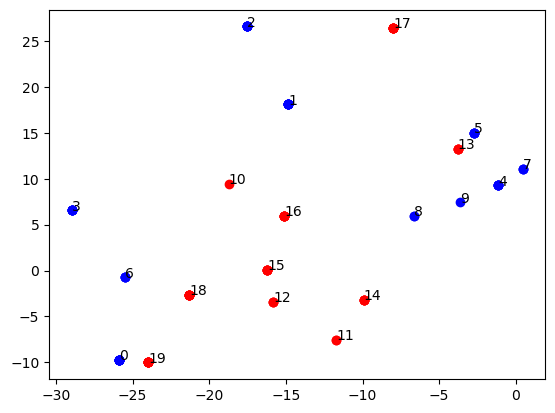

In [24]:
for i in range(iClaims):
    if i < iClaims / 2:
        plt.plot(encoded_data[0:(i + 1), 0], encoded_data[0:(i + 1), 1], "o", color = "blue")
    else:
        plt.plot(encoded_data[i:, 0], encoded_data[i:, 1], "o", color = "red")
        
for i, txt in enumerate(range(iClaims)):
    plt.plot(encoded_data[i, 0], encoded_data[i, 1])
    plt.annotate(txt, (encoded_data[i, 0], encoded_data[i, 1]))

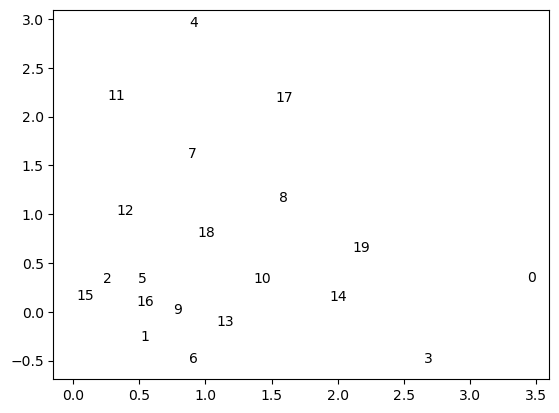

In [6]:
for i, txt in enumerate(range(iClaims)):
    plt.plot(encoded_data[i, 0], encoded_data[i, 1])
    plt.annotate(txt, (encoded_data[i, 0], encoded_data[i, 1]))

In [25]:
import difflib
def find_closest_string(target_string, string_list):
    
    if "<|endoftext|>" not in target_string[-13:]:
        return None, None, None
    
    else:
    
        closest_match = difflib.get_close_matches(target_string[:-13], string_list, n=1, cutoff=0.999)
        if closest_match:
            closest_index = string_list.index(closest_match[0])
            similarity_ratio = difflib.SequenceMatcher(None, target_string, closest_match[0]).ratio()
            
            return closest_match[0], closest_index, similarity_ratio
        
        else:
            return None, None, None

def find_new_string(target_string, string_list):
    
    if "<|endoftext|>" not in target_string[-13:]:
        return False
    
    else:
    
        closest_match = difflib.get_close_matches(target_string[:-13], string_list, n=1, cutoff=1)

        if closest_match:
            return False
        
        else:

            print(f"New string: {target_string}")
            return True

In [8]:
find_new_string("Transform dull strands into radiant, luminous locks.<|endoftext|>", lTargetStrings)

New string: Transform dull strands into radiant, luminous locks.<|endoftext|>


True

In [32]:
lTargetStrings

['Boost Your Immunity with Every Spoonful.',
 'Packed with Probiotics for a Healthier You.',
 'Nourish Your Body with Natural Goodness.',
 'Strengthen Your Gut with Live Cultures.',
 'Low in Sugar, High in Vital Nutrients.',
 'Daily Dose of Calcium for Strong Bones.',
 'Feel Energized with Protein-Rich Yoghurt.',
 'Healthy Digestion Starts Here.',
 'Antioxidant-Rich for a Balanced Diet.',
 'Supports Heart Health with Omega-3s.',
 'Indulge in Creamy Delight.',
 'Rich, Velvety Texture in Every Bite.',
 'Taste the Burst of Real Fruit Flavor.',
 'Pure Decadence Without the Guilt.',
 'Experience the Silky Smooth Perfection.',
 'Savor the Freshness of Farm-Fresh Ingredients.',
 'Gourmet Flavors to Satisfy Your Cravings.',
 'Deliciously Tangy, Perfectly Sweet.',
 'Treat Your Taste Buds to Luxurious Bliss.',
 'Heavenly Taste in Every Spoonful.']

In [30]:
def drange(start, stop, step):
    r = start
    while r < stop:
        yield r
        r += step

new_valid_strings = []
closest_matches = []
lPoints = []

step_x = 1
step_y = 1
min_x = -30
max_x = 10
min_y = -10
max_y = 30
lGeneratedStrings = []
for x in drange(min_x, max_x, step_x):
    for y in drange(min_y, max_y, step_y):
        point = torch.tensor([x, y], dtype=torch.float32)
        lPoints.append(point.detach().cpu().numpy())
        generated_string = tokenizer.decode(fn_gen_new(point)[0])
        lGeneratedStrings.append(generated_string)
        
        closest_string, closest_index, distance_measure = find_closest_string(generated_string, lTargetStrings)
        
        if closest_string is None: 
            closest_index = -1
        
        closest_matches.append((point, closest_index, distance_measure))
        new_valid_strings.append(find_new_string(generated_string, lTargetStrings))

New string: Boost Your Immunity with Protein-Rich Yoghurt.<|endoftext|>
New string: Boost Your Immunity with Protein-Rich Yoghurt.<|endoftext|>
New string: Packed with Probiotics for a Good.<|endoftext|>
New string: Packed with Probiotics for a Good.<|endoftext|>
New string: Boost Your Immunity with Protein-Rich Yoghurt.<|endoftext|>
New string: Indulge in Imitation Confessment.<|endoftext|>
New string: Packed with Probiotics for a Good.<|endoftext|>
New string: Packed with Probiotics for a Good.<|endoftext|>
New string: Boost Your Immunity with Protein-Rich Yoghurt.<|endoftext|>
New string: Indulge in Imitation Confessment.<|endoftext|>
New string: Packed with Probiotics for a Good Protein.<|endoftext|>
New string: Packed with Probiotics for a Good Probation.<|endoftext|>
New string: Packed with Probiotics for a Good Probation.<|endoftext|>
New string: Packed with Probiotics for a Good.<|endoftext|>
New string: Packed with Probiotics for a Good.<|endoftext|>
New string: Heavenly Taste

KeyboardInterrupt: 

In [10]:
lNewStrings = [s for i, s in enumerate(lGeneratedStrings) if new_valid_strings[i]] 
lNewPoints  = [s for i, s in enumerate(lPoints) if new_valid_strings[i]] 

In [11]:
len(lNewPoints)

119

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


 Quality Quality Quality Quality Quality Quality Quality Quality Quality Quality Quality Quality Quality


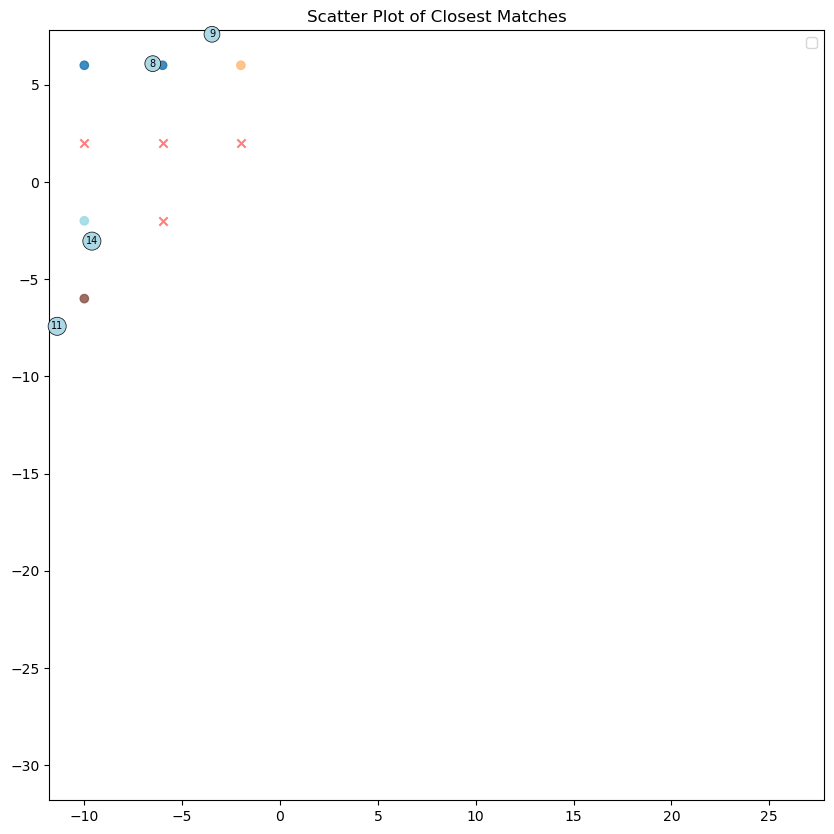

In [29]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

# Extract the x and y coordinates from closest_matches
x_coords = np.asarray([point[0][0].item() for point in closest_matches])
y_coords = np.asarray([point[0][1].item() for point in closest_matches])

# Extract the closest_index values
colors = [point[1] for point in closest_matches]
similarity_ratio = [similarity_ratio[2] for similarity_ratio in closest_matches]

# Plot the scatter plot
vNull = np.asarray(colors) == -1
vNew = np.asarray(new_valid_strings)

tPoint = torch.tensor([0, 0], dtype=torch.float32)
print(tokenizer.decode(fn_gen_new(tPoint)[0]))

# cmap="hsv"
plt.scatter(x_coords[vNull], y_coords[vNull], c="white", marker=".", alpha=0.2)
plt.scatter(x_coords[~vNull], y_coords[~vNull], c=np.asarray(colors)[~vNull], marker="o", alpha=np.asarray(similarity_ratio)[~vNull], cmap="tab20")
plt.scatter(x_coords[vNew], y_coords[vNew], c="red", marker="x", alpha=0.5)
#plt.scatter(encoded_data[:, 0], encoded_data[:, 1], marker="x", c = range(len(lTargetStrings)), cmap="tab20")


# # Compute the convex hull
# hull = ConvexHull(encoded_data)

# # Plot the convex hull
# for simplex in hull.simplices:
#     plt.plot(encoded_data[simplex, 0], encoded_data[simplex, 1], '--', c="grey")

for i, txt in enumerate(range(encoded_data.shape[0])):
    plt.annotate(txt, (encoded_data[i, 0], encoded_data[i, 1]), size = 7, bbox=dict(boxstyle="circle",
                      fc="lightblue", lw=0.5))
    
#plt.plot(tPoint.cpu().detach().numpy()[0], tPoint[1].cpu().detach().numpy(), 'rx', c="black")


# Add labels and title
plt.title('Scatter Plot of Closest Matches')
plt.legend()
# Show the plot
plt.show()

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations

def calculate_cosine_similarity(lGeneratedStrings):
    """
    Calculate cosine similarities between all pairs of strings in the input list.

    Args:
    lGeneratedStrings (list): A list of strings.

    Returns:
    list of tuples: A list containing tuples where each tuple represents a pair of strings and their cosine similarity.
    """

    # Step 1: Convert strings to TF-IDF vectors
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(lGeneratedStrings)

    # Step 2: Compute cosine similarity between all pairs of vectors
    cosine_similarities = cosine_similarity(tfidf_matrix, tfidf_matrix)

    # List to store results
    similarities = []

    # Calculate and store cosine similarities
    mSim = np.zeros((len(lGeneratedStrings), len(lGeneratedStrings)))
    for i, j in combinations(range(len(lGeneratedStrings)), 2):
        similarity = cosine_similarities[i, j]
        mSim[i, j] = similarity
        
    mSim = mSim + mSim.T

    return mSim

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [31]:
from scipy.spatial.distance import cdist
mSim = calculate_cosine_similarity(lNewStrings)
mEuclidean = cdist(lNewPoints, lNewPoints, metric='euclidean')

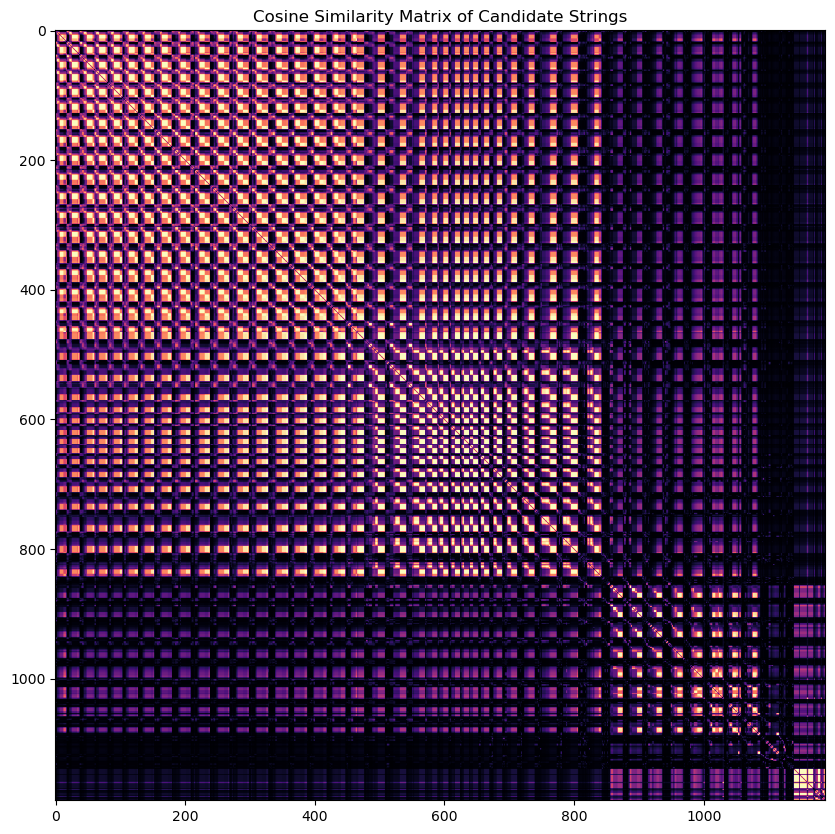

In [32]:
plt.figure(figsize=(10, 10))
plt.imshow(mSim, cmap="magma")
plt.title("Cosine Similarity Matrix of Candidate Strings")
plt.savefig("cosine.png")

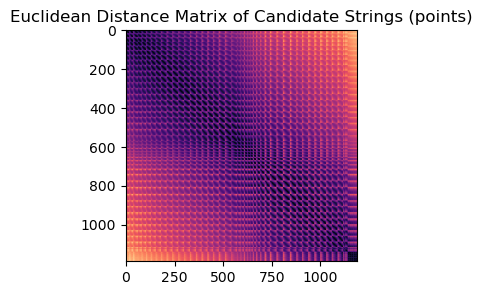

In [33]:
plt.figure(figsize=(3, 3))
plt.imshow(mEuclidean / np.sum(mEuclidean), cmap="magma" )
plt.title("Euclidean Distance Matrix of Candidate Strings (points)")
plt.savefig("euclidean.png")

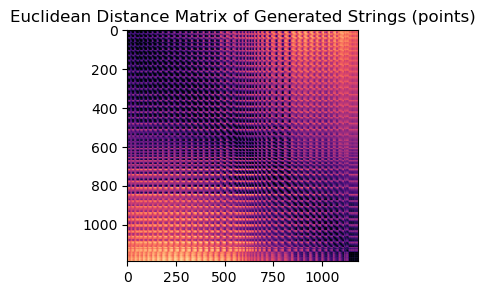

In [34]:
plt.figure(figsize=(3, 3))
plt.imshow((mEuclidean / np.sum(mEuclidean, axis=1)) * (1 - mSim), cmap="magma")
plt.title("Euclidean Distance Matrix of Generated Strings (points)")
plt.show()
 

/Users/hoener/miniforge3/envs/mphil/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/hoener/miniforge3/envs/mphil/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/hoener/miniforge3/envs/mphil/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/hoener/miniforge3/envs/mphil/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated

KeyboardInterrupt: 

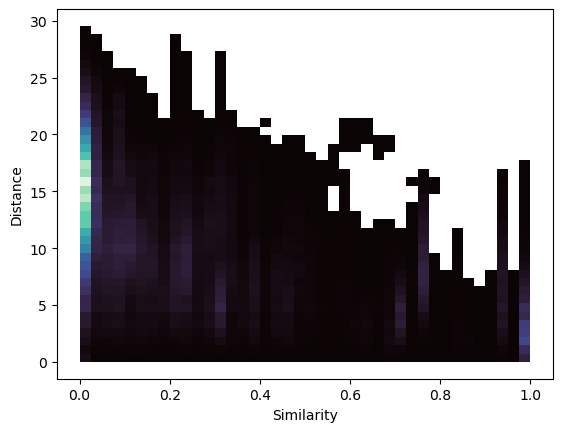

In [35]:
import seaborn as sns
df = pd.DataFrame({'Similarity': mSim.flatten(), 'Distance': mEuclidean.flatten()})


# Load the planets dataset and initialize the figure

sns.histplot(data = df, x="Similarity", y="Distance", bins=40,  cmap="mako")
sns.kdeplot(data = df, x="Similarity", y="Distance", levels=5, color="w", linewidths=1)

In [ ]:
from openai import OpenAI
client = OpenAI()

def rater(x): 
  completion = client.chat.completions.create(
  model="gpt-3.5-turbo",
  messages=[
    {"role": "system", "content": "You are a marketeer, assessing advertising claims. You will read an advertising claim and give it a rating from 1 to 5 based on how well it will appeal to consumers. Pay attention to whether these claims are grammatically correct. Only answer with the number itself."},
    {"role": "user", "content": x[:-13]}
  ])
  
  try:
    answer = int(completion.choices[0].message.content)
    return answer
  
  except:
    return 0
  
lRatingsNewStrings = [rater(x) for i, x in enumerate(lGeneratedStrings) if new_valid_strings[i]]